In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from collections import Counter
import pickle, os, gzip, json, sys, itertools
import seaborn

In [2]:
df = pd.read_csv("/home/miaocj/docker_dir/kNN-overlap-finder/data/evaluation/summarize_human.csv",header=None,sep='\t')
new_headers = ['sample','sequence_type','method', 'n_neighbors','precision', 'recall', 'continuity']
df = df.iloc[:,[0,1,3,4,5,8,17]]
df.columns=new_headers

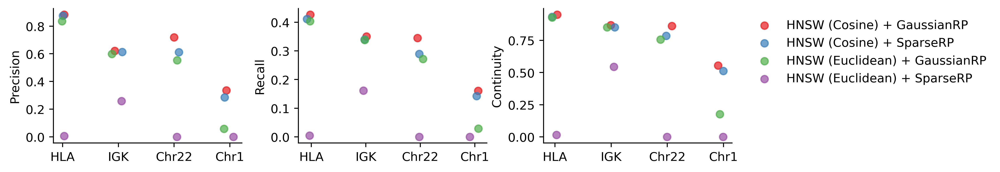

In [ ]:
df = pd.read_csv("/home/miaocj/docker_dir/kNN-overlap-finder/data/evaluation/summarize_human.csv",header=None,sep='\t')
new_headers = ['sample','sequence_type','method', 'n_neighbors','precision', 'recall', 'continuity']
df = df.iloc[:,[0,1,3,4,5,8,17]]
df.columns=new_headers

samples = ['./human/HLA','./human/IGK','./human/chr22','./human/chr1']

target_df = df[(df.n_neighbors==6)&(df.method.str.contains('HNSW'))&(df.loc[:,'sample'].isin(samples))]
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
samples_in_pic =['HLA','IGK','Chr22','Chr1']
target_method = ['HNSW_Cosine_GaussianRP_500d_IDF','HNSW_Cosine_SparseRP_500d_IDF','HNSW_Euclidean_GaussianRP_500d_IDF','HNSW_Euclidean_SparseRP_500d_IDF']
target_method_in_pic = ['HNSW (Cosine) + GaussianRP','HNSW (Cosine) + SparseRP','HNSW (Euclidean) + GaussianRP','HNSW (Euclidean) + SparseRP']
colors = sns.color_palette(palette='Set1')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity'] 
ylabel_in_pic = ['Precision','Recall','Continuity'] 


for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method_in_pic):
        method_values = target_df[(target_df.loc[:,'method']==target_method[i])&(target_df.sequence_type=='cyclone')].loc[:,ylabel[num]].tolist()
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=method,alpha=0.7,marker='o')
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel_in_pic[num])

ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)
# plt.savefig("random_projection.pdf", dpi=600)

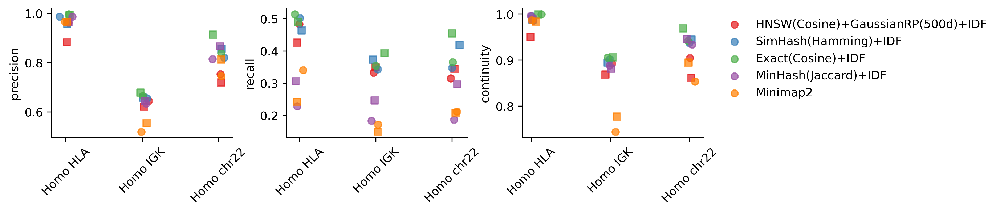

In [58]:
target_method = ['HNSW_Cosine_GaussianRP_500d_IDF','SimHash_Hamming_None_IDF','Exact_Cosine_None_IDF','MinHash_Jaccard_None_IDF','Minimap2']
target_method_in_pic = ['HNSW(Cosine)+GaussianRP(500d)+IDF','SimHash(Hamming)+IDF','Exact(Cosine)+IDF','MinHash(Jaccard)+IDF','Minimap2']
samples = ['./human/HLA','./human/IGK','./human/chr22']
samples_in_pic =['Homo HLA','Homo IGK','Homo chr22']
target_df = df[(df.n_neighbors==6)&(df.method.isin(target_method))&(df.loc[:,'sample'].isin(samples))]
colors = sns.color_palette(palette='Set1')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity'] 

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method_in_pic):
        method_values = target_df[(target_df.loc[:,'method']==target_method[i])&(target_df.sequence_type=='ONT_R9')].loc[:,ylabel[num]].tolist()
        x = rand_jitter([1,2,3]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=method,alpha=0.7,marker='o')
        method_values = target_df[(target_df.loc[:,'method']==target_method[i])&(target_df.sequence_type=='cyclone')].loc[:,ylabel[num]].tolist()
        x = rand_jitter([1,2,3]).tolist()
        ax.scatter(x, method_values, color=colors[i],alpha=0.7,marker='s')
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)

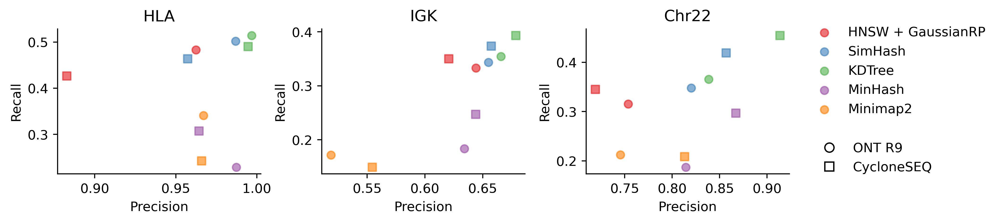

In [17]:
target_method = ['HNSW_Cosine_GaussianRP_500d_IDF','SimHash_Hamming_None_IDF','Exact_Cosine_None_IDF','MinHash_Jaccard_None_IDF','Minimap2']
target_method_in_pic = ['HNSW + GaussianRP','SimHash','KDTree','MinHash','Minimap2']
samples = ['./human/HLA','./human/IGK','./human/chr22']
samples_in_pic =['HLA','IGK','Chr22']
target_df = df[(df.n_neighbors==6)&(df.method.isin(target_method))&(df.loc[:,'sample'].isin(samples))]
colors = sns.color_palette(palette='Set1')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['Precision','Recall','continuity'] 

for num,ax in enumerate([ax1,ax2,ax3]):
    x = target_df[(target_df.loc[:,'sample']==samples[num])&(target_df.sequence_type=='ONT_R9')].set_index('method').loc[target_method,'precision'].tolist()
    y = target_df[(target_df.loc[:,'sample']==samples[num])&(target_df.sequence_type=='ONT_R9')].set_index('method').loc[target_method,'recall'].tolist()
    for i in range(0, 5):
        ax.scatter(x[i], y[i], color=colors[i],label=target_method_in_pic[i],alpha=0.6,marker='o')
    
    x = target_df[(target_df.loc[:,'sample']==samples[num])&(target_df.sequence_type=='cyclone')].set_index('method').loc[target_method,'precision'].tolist()
    y = target_df[(target_df.loc[:,'sample']==samples[num])&(target_df.sequence_type=='cyclone')].set_index('method').loc[target_method,'recall'].tolist()
    for i in range(0, 5):
        ax.scatter(x[i], y[i], color=colors[i],alpha=0.6,marker='s')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    ax.set_xlabel(ylabel[0])
    ax.set_ylabel(ylabel[1])
    ax.set_title(samples_in_pic[num])

symbol_handles = [plt.Line2D([0], [0], marker=['o','s'][i], color='w', markeredgecolor='black',markerfacecolor=None,markersize=7) 
                  for i in range(0,2)]
symbol_labels = ['ONT R9','CycloneSEQ']
shape_legend = ax.legend(handles=symbol_handles, labels=symbol_labels, loc='upper right',frameon=False,bbox_to_anchor=(1.76,0.3))
ax.add_artist(shape_legend)
ax3.legend(bbox_to_anchor=(1.05, 1.1), loc='upper left',frameon=False)
plt.savefig("realdata_different_method.pdf", dpi=600)

In [4]:
plt.rcParams['figure.dpi'] = 400
subtitution = {}
preprocess = ['TF','IDF','TF-IDF','None']
target_method = []
target_method_in_pic = []
for pre in preprocess:
    target_method.append('Exact_Cosine_None_'+pre)
    target_method_in_pic.append('Exact(Cosine)+'+pre)
    subtitution['Exact_Cosine_None_'+pre] = 'Exact(Cosine)+'+pre
    target_method.append('Exact_Euclidean_None_'+pre)
    target_method_in_pic.append('Exact(Euclidean)+'+pre)
    subtitution['Exact_Euclidean_None_'+pre] = 'Exact(Euclidean)+'+pre

In [23]:
df = pd.read_csv("/home/miaocj/docker_dir/kNN-overlap-finder/data/evaluation/sim.csv",header=None,sep='\t')
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,./CHM13/HLA,pbsim_ONT_93_20k,0,Exact_Euclidean_None_TF-IDF,2,0.998352,0.426469,0.079258,0.357411,22,0.002081,86,0.016266,0.997919
1,./CHM13/HLA,pbsim_ONT_93_20k,1,Exact_Euclidean_None_TF-IDF,3,0.998376,0.380198,0.114900,0.461910,6,0.000567,254,0.048042,0.999433
2,./CHM13/HLA,pbsim_ONT_93_20k,2,Exact_Euclidean_None_TF-IDF,4,0.998316,0.346739,0.149663,0.548747,0,0.000000,2669,0.504823,1.000000
3,./CHM13/HLA,pbsim_ONT_93_20k,3,Exact_Euclidean_None_TF-IDF,5,0.998108,0.319918,0.182445,0.617328,0,0.000000,2702,0.511065,1.000000
4,./CHM13/HLA,pbsim_ONT_93_20k,4,Exact_Euclidean_None_TF-IDF,6,0.998000,0.299817,0.214601,0.680580,0,0.000000,2702,0.511065,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46868,./TAIR/chr3,pbsim_ONT_93_30k,14,HNSW_Cosine_umap_500d_IDF,16,0.884757,0.139113,0.435395,0.717294,1387,0.045700,96,0.006326,0.954300
46869,./TAIR/chr3,pbsim_ONT_93_30k,15,HNSW_Cosine_umap_500d_IDF,17,0.880405,0.135383,0.456011,0.734728,1384,0.045601,98,0.006458,0.954399
46870,./TAIR/chr3,pbsim_ONT_93_30k,16,HNSW_Cosine_umap_500d_IDF,18,0.875291,0.131640,0.475896,0.749923,1377,0.045371,99,0.006524,0.954629
46871,./TAIR/chr3,pbsim_ONT_93_30k,17,HNSW_Cosine_umap_500d_IDF,19,0.869868,0.127938,0.495459,0.763529,1375,0.045305,99,0.006524,0.954695


/tmp/ipykernel_1508316/1965646466.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df[['method', 'preprocess']] = target_df['method'].str.rsplit('_', n=1, expand=True)
/tmp/ipykernel_1508316/1965646466.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df[['method', 'preprocess']] = target_df['method'].str.rsplit('_', n=1, expand=True)
/tmp/ipykernel_1508316/1965646466.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an undersco

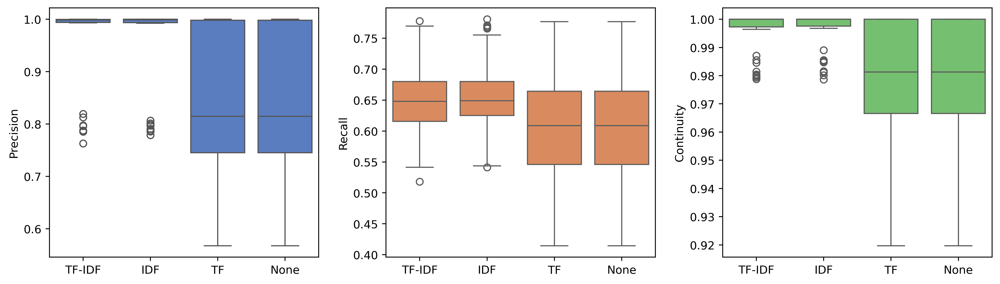

In [34]:
df = pd.read_csv("/home/miaocj/docker_dir/kNN-overlap-finder/data/evaluation/sim.csv",header=None,sep='\t')
new_headers = ['sample','sequence_type','method', 'n_neighbors','precision', 'recall', 'continuity']
df = df.iloc[:,[0,1,3,4,5,8,13]]
df.columns=new_headers
preprocess = ['TF','IDF','TF-IDF','None']
target_method = []
for pre in preprocess:
    target_method.append('Exact_Cosine_None_'+pre)
    target_method.append('Exact_Euclidean_None_'+pre)
target_df = df[(df.method.isin(target_method))&(df.n_neighbors==6)]
target_df[['method', 'preprocess']] = target_df['method'].str.rsplit('_', n=1, expand=True)
metrics = ['precision','recall','continuity']
colors = sns.color_palette(palette='muted')
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for i in range(0,3):
    sns.boxplot(x = 'preprocess',ax=axes[i],y =metrics[i],data = target_df,color=colors[i]) 
axes[0].set_xlabel("")
axes[1].set_xlabel("")
axes[2].set_xlabel("")
axes[0].set_ylabel("Precision")
axes[1].set_ylabel("Recall")
axes[2].set_ylabel("Continuity")
plt.subplots_adjust(wspace=0.25)
plt.legend(loc = (0.1,0.15),frameon=False)
plt.savefig("preprocess_boxplot.pdf", dpi=600)

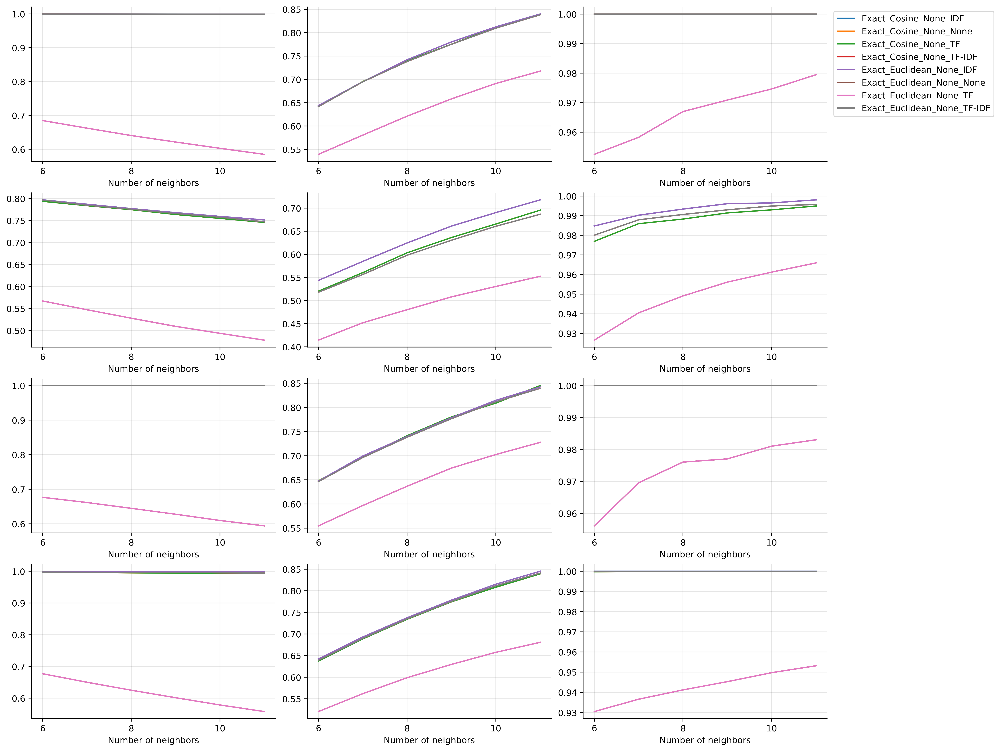

In [56]:
for pre in preprocess:
    target_method.append('Exact_Cosine_None_'+pre)
    target_method_in_pic.append('Exact(Cosine)+'+pre)
    subtitution['Exact_Cosine_None_'+pre] = 'Exact(Cosine)+'+pre
    target_method.append('Exact_Euclidean_None_'+pre)
    target_method_in_pic.append('Exact(Euclidean)+'+pre)
    subtitution['Exact_Euclidean_None_'+pre] = 'Exact(Euclidean)+'+pre
target_df = df[(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')]
target_df = target_df[target_df['n_neighbors'].isin(range(6,12))]
k_values = np.arange(6,12)
y_labels = dict(
    precision="Precision",
    nr_recall="Recall\n(non-redundant overlaps)",
    Continuity="Continuity\n(after removing incorrect edges)",
)
my_y = ['precision','recall','continuity']
color_list = seaborn.color_palette("tab10")
region = ['./CHM13/HLA','./CHM13/IGK','./yeast/chr10','./TAIR/chr3']

fig, axes= plt.subplots(4, 3, figsize=(16, 12), constrained_layout=True)
for i, ax in enumerate(itertools.chain(*axes)):
    y = my_y[i%3]
    x = 'n_neighbors'
    hue='method'
    for region_num in [0,1,2,3]:
        region_df = target_df[target_df['sample'] == region[region_num]]
        if i in [region_num*3,region_num*3+1,region_num*3+2]:
            for j,(desc, group) in enumerate(region_df.groupby(hue)): 
                if 'Gau' in desc:  
                    linestyle = 'dashed'  
                elif 'Block' in desc: 
                    linestyle = 'solid'
                elif '--' in desc:
                    linestyle = 'dashdot'
                else:
                    linestyle = 'solid'
                ax.plot(group[x], group[y], label=desc, color = color_list[j], linestyle = linestyle)
    ax.set_xticks([ x for x in k_values if x%2==0]) 
    ax.set_xlabel("Number of neighbors")  
    # ax.set_ylabel(y_labels[y])  
    ax.grid(axis='both', color='k', alpha=0.1)  
    
    if i == 2:
        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1))

    ax.spines[['top', 'right']].set_visible(False)

In [57]:
df[(df.method== 'Exact_Cosine_None_IDF')& 
               (df['n_neighbors'].isin(range(6,7)))& 
               (df.sequence_type.str.contains('ONT'))&
               (df.sequence_type.str.contains('95'))]

,sample,sequence_type,method,n_neighbors,precision,recall,continuity
669,./CHM13/HLA,pbsim_ONT_95_10k,Exact_Cosine_None_IDF,6,0.997034,0.770815,1.000000
1163,./CHM13/HLA,pbsim_ONT_95_20k,Exact_Cosine_None_IDF,6,0.998189,0.678610,1.000000
1923,./CHM13/HLA,pbsim_ONT_95_30k,Exact_Cosine_None_IDF,6,0.998762,0.646722,1.000000
21702,./CHM13/IGK,pbsim_ONT_95_10k,Exact_Cosine_None_IDF,6,0.787543,0.646453,0.980176
25559,./CHM13/IGK,pbsim_ONT_95_20k,Exact_Cosine_None_IDF,6,0.801041,0.569582,0.985519
29435,./CHM13/IGK,pbsim_ONT_95_30k,Exact_Cosine_None_IDF,6,0.806566,0.558657,0.985145
40417,./yeast/chr10,pbsim_ONT_95_10k,Exact_Cosine_None_IDF,6,1.000000,0.765633,1.000000
40968,./yeast/chr10,pbsim_ONT_95_20k,Exact_Cosine_None_IDF,6,1.000000,0.675330,1.000000
41690,./yeast/chr10,pbsim_ONT_95_30k,Exact_Cosine_None_IDF,6,1.000000,0.644032,1.000000
45148,./TAIR/chr3,pbsim_ONT_95_10k,Exact_Cosine_None_IDF,6,0.999677,0.766513,1.000000


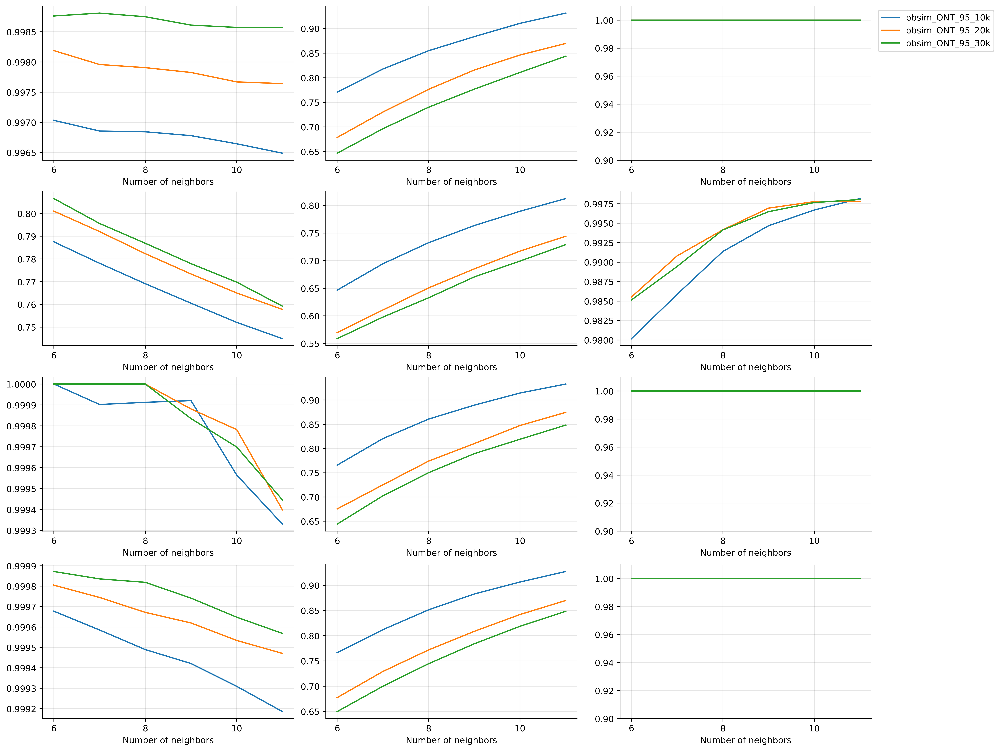

In [58]:
target_df = df[(df.method== 'Exact_Cosine_None_IDF')& 
               (df['n_neighbors'].isin(range(6,12)))& 
               (df.sequence_type.str.contains('ONT'))&
               (df.sequence_type.str.contains('95'))]
k_values = np.arange(6,12)
y_labels = dict(
    precision="Precision",
    nr_recall="Recall\n(non-redundant overlaps)",
    Continuity="Continuity\n(after removing incorrect edges)",
)
my_y = ['precision','recall','continuity']
color_list = seaborn.color_palette("tab10")
region = ['./CHM13/HLA','./CHM13/IGK','./yeast/chr10','./TAIR/chr3']

fig, axes= plt.subplots(4, 3, figsize=(16, 12), constrained_layout=True)
for i, ax in enumerate(itertools.chain(*axes)):
    y = my_y[i%3]
    x = 'n_neighbors'
    hue='sequence_type'
    for region_num in [0,1,2,3]:
        region_df = target_df[target_df['sample'] == region[region_num]]
        if i in [region_num*3,region_num*3+1,region_num*3+2]:
            for j,(desc, group) in enumerate(region_df.groupby(hue)): 
                if 'Gau' in desc:  
                    linestyle = 'dashed'  
                elif 'Block' in desc: 
                    linestyle = 'solid'
                elif '--' in desc:
                    linestyle = 'dashdot'
                else:
                    linestyle = 'solid'
                ax.plot(group[x], group[y], label=desc, color = color_list[j], linestyle = linestyle)
    if i in [2,8,11]:
        ax.set_ylim(0.9,1.01)
    ax.set_xticks([ x for x in k_values if x%2==0]) 
    ax.set_xlabel("Number of neighbors")  
    # ax.set_ylabel(y_labels[y])  
    ax.grid(axis='both', color='k', alpha=0.1)  
    
    if i == 2:
        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1))

    ax.spines[['top', 'right']].set_visible(False)

In [58]:
target_df = df[(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k') & (target_df.loc[:,'n_neighbors'] == 6)]

In [62]:
target_df

,sample,sequence_type,method,n_neighbors,precision,recall,continuity,distance,preprocess
3785,./CHM13/HLA,pbsim_ONT_93_30k,Exact(Euclidean)+IDF,6,0.999509,0.643740,1.000000,Exact(Euclidean),IDF
3842,./CHM13/HLA,pbsim_ONT_93_30k,Exact(Cosine)+IDF,6,0.999509,0.643740,1.000000,Exact(Cosine),IDF
46535,./TAIR/chr3,pbsim_ONT_93_30k,Exact(Cosine)+IDF,6,0.999956,0.642361,1.000000,Exact(Cosine),IDF
46459,./TAIR/chr3,pbsim_ONT_93_30k,Exact(Euclidean)+IDF,6,0.999956,0.642361,1.000000,Exact(Euclidean),IDF
43666,./yeast/chr10,pbsim_ONT_93_30k,Exact(Cosine)+IDF,6,1.000000,0.647456,1.000000,Exact(Cosine),IDF
37130,./CHM13/IGK,pbsim_ONT_93_30k,Exact(Euclidean)+IDF,6,0.796883,0.543685,0.984724,Exact(Euclidean),IDF
43609,./yeast/chr10,pbsim_ONT_93_30k,Exact(Euclidean)+IDF,6,1.000000,0.647456,1.000000,Exact(Euclidean),IDF
37282,./CHM13/IGK,pbsim_ONT_93_30k,Exact(Cosine)+IDF,6,0.796883,0.543685,0.984724,Exact(Cosine),IDF
39144,./CHM13/IGK,pbsim_ONT_93_30k,Exact(Euclidean)+None,6,0.567317,0.414454,0.926557,Exact(Euclidean),None
46592,./TAIR/chr3,pbsim_ONT_93_30k,Exact(Cosine)+None,6,0.996426,0.637131,0.999736,Exact(Cosine),None


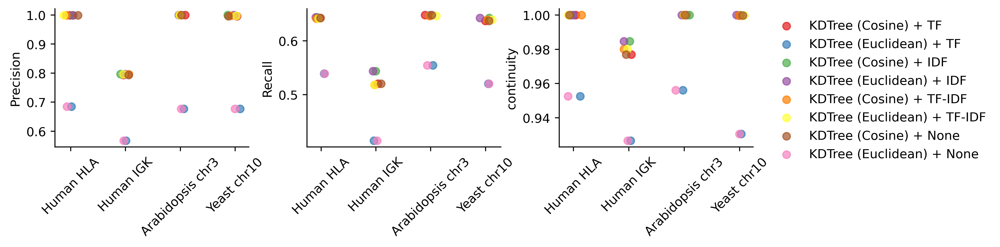

In [72]:
subtitution = {}
preprocess = ['TF','IDF','TF-IDF','None']
target_method = []
target_method_in_pic = []
for pre in preprocess:
    target_method.append('Exact_Cosine_None_'+pre)
    target_method_in_pic.append('KDTree (Cosine) + '+pre)
    subtitution['Exact_Cosine_None_'+pre] = 'KDTree (Cosine) + '+pre
    target_method.append('Exact_Euclidean_None_'+pre)
    target_method_in_pic.append('KDTree (Euclidean) + '+pre)
    subtitution['Exact_Euclidean_None_'+pre] = 'KDTree (Euclidean) + ' +pre

target_df = df[(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k') & (target_df.loc[:,'n_neighbors'] == 6)]
target_df = target_df.replace(subtitution)
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
samples = ['./CHM13/HLA','./CHM13/IGK','./TAIR/chr3','./yeast/chr10']
samples_in_pic =['Human HLA','Human IGK','Arabidopsis chr3','Yeast chr10']
colors = sns.color_palette(palette='Set1')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']
ylabel_in_pic = ['Precision','Recall','continuity'] 

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method_in_pic):
        method_values = target_df[target_df.loc[:,'method']==method].loc[:,ylabel[num]].tolist()
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=method,alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel_in_pic[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)
plt.savefig("preprocess_dotplot.pdf", dpi=600)

In [60]:
target_method = ['Exact_Cosine_None_IDF','WeightedMinHash_Jaccard_None_IDF','Minimap2']
target_df = df[(df.loc[:,'n_neighbors'] == 6)&(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')].sort_values(by=['method','sample'])

[0.9995086598697948, 0.7968828557063852, 0.9999555318392032, 1.0]
[0.9938868353710548, 0.7353587652029502, 0.9949304687568286, 0.9994653121240475]
[0.9690694626474444, 0.5039381253104378, 0.996640625, 1.0]
[0.6437404474086424, 0.5436853841475775, 0.6423614671999454, 0.6474558670820353]
[0.2424621370015284, 0.2471112913034664, 0.2429494410829658, 0.2180685358255451]
[0.5242462137001529, 0.2696128116764646, 0.5437732882097562, 0.559190031152648]
[1.0, 0.9847238542890716, 1.0, 1.0]
[0.9998657357679914, 0.9651390520955738, 0.9999341021416804, 1.0]
[0.9865735767991408, 0.7379553466509988, 0.9992751235584844, 1.0]


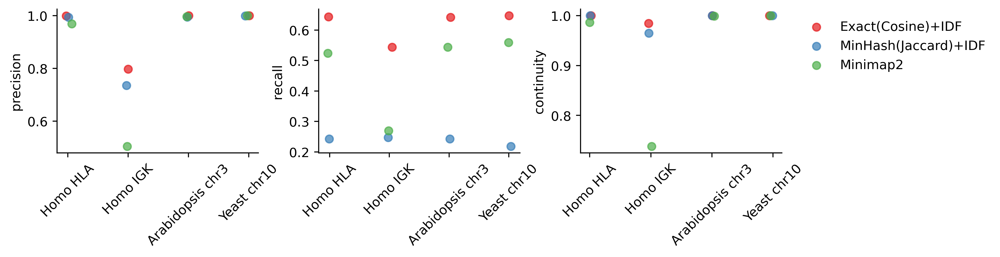

In [62]:
target_method = ['Exact_Cosine_None_IDF','WeightedMinHash_Jaccard_None_IDF','Minimap2']
target_method_in_pic = ['Exact(Cosine)+IDF','MinHash(Jaccard)+IDF','Minimap2']
target_df = df[(df.loc[:,'n_neighbors'] == 6)&(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')].sort_values(by=['method','sample'])
samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']
 
def rand_jitter(arr):
    stdev = .01 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='Set1')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        print(method_values)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)

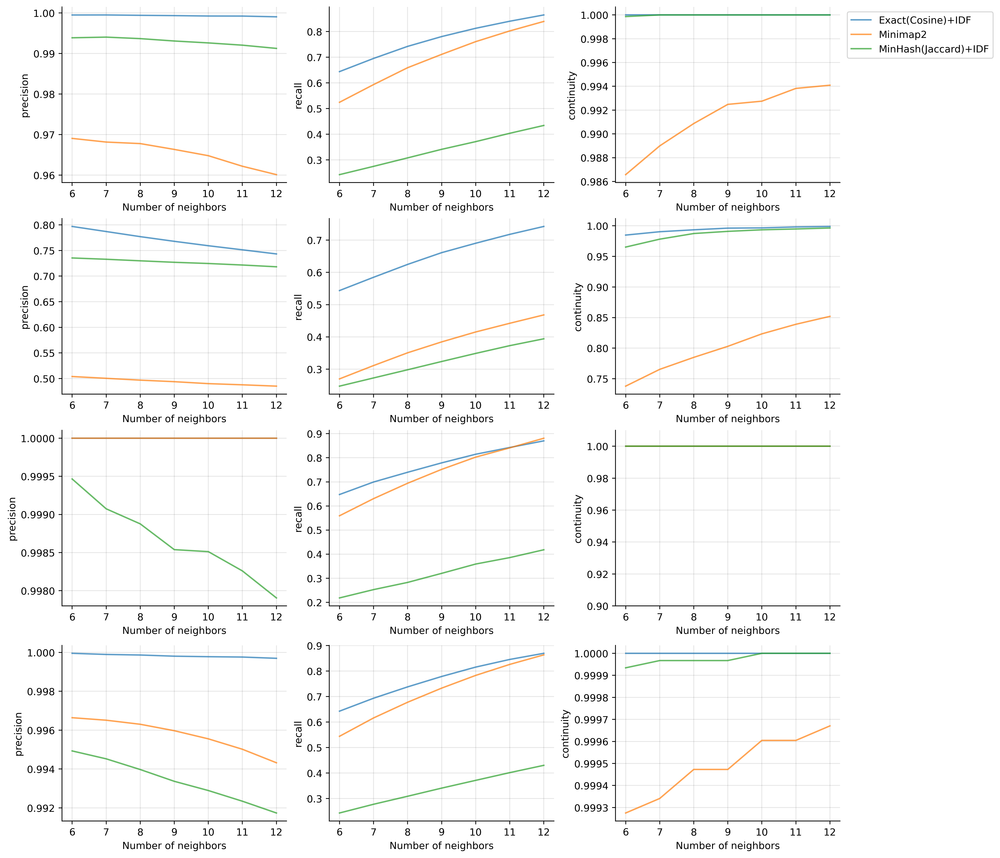

In [63]:
target_method = ['Exact_Cosine_None_IDF','WeightedMinHash_Jaccard_None_IDF','Minimap2']
target_method_in_pic = ['Exact(Cosine)+IDF','Minimap2','MinHash(Jaccard)+IDF']
target_df = df[(df['n_neighbors'].isin(range(6,13)))&(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')].sort_values(by=['method','sample'])
samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']

k_values = np.arange(6, 13)
y_labels = dict(
    precision="Precision",
    nr_recall="Recall\n(non-redundant overlaps)",
    Continuity="Continuity\n(after removing incorrect edges)",
)
my_y = ['precision','recall','continuity']
color_list = seaborn.color_palette("tab10")
region = ['./CHM13/HLA','./CHM13/IGK','./yeast/chr10','./TAIR/chr3']

fig, axes= plt.subplots(4, 3, figsize=(14, 12), constrained_layout=True)
for i, ax in enumerate(itertools.chain(*axes)):
    y = my_y[i%3]
    x = 'n_neighbors'
    hue='method'
    for region_num in [0,1,2,3]:
        region_df = target_df[target_df['sample'] == region[region_num]]
        if i in [region_num*3,region_num*3+1,region_num*3+2]:
            for j,(desc, group) in enumerate(region_df.groupby(hue)): 
                if 'Gau' in desc:  
                    linestyle = 'dashed'  
                elif 'Block' in desc: 
                    linestyle = 'solid'
                elif '--' in desc:
                    linestyle = 'dashdot'
                else:
                    linestyle = 'solid'
                ax.plot(group[x], group[y], label=target_method_in_pic[j], color = color_list[j], linestyle = linestyle,alpha=0.7)
        if i==8:
            ax.set_ylim(0.9,1.01)
    ax.set_ylabel(y)
    ax.set_xticks(k_values) 
    ax.set_xlabel("Number of neighbors")  
    # ax.set_ylabel(y_labels[y])  
    ax.grid(axis='both', color='k', alpha=0.1)  
    
    if i == 2:
        ax.legend(loc="upper left", bbox_to_anchor=(1.01, 1))

    ax.spines[['top', 'right']].set_visible(False)

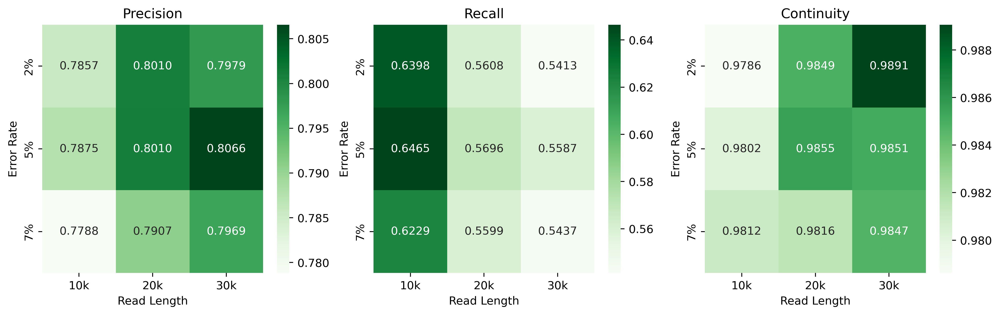

<Figure size 2560x1920 with 0 Axes>

In [76]:
target_method = ['Exact_Cosine_None_IDF']
target_df = df[df.method.isin(target_method)]
target_df2 = target_df[(target_df.loc[:,'n_neighbors'] == 6)&(target_df.loc[:,'sequence_type'].str.contains('ONT'))&(target_df.loc[:,'sample']=='./CHM13/IGK')].sort_values(by=['sample','sequence_type'])
target_df2[['error_rate','length']]= target_df2['sequence_type'].str.rsplit('_', n=1, expand=True)
target_df2 = target_df2.replace({'pbsim_ONT_93':'7%','pbsim_ONT_95':'5%','pbsim_ONT_98':'2%'})
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
metrics = ['precision','recall','continuity']
ylabel_in_pic = ['Precision','Recall','Continuity']
for i in range(0,3):
    heatmap_data = target_df2.pivot_table(index='error_rate',columns='length', values=metrics[i], aggfunc='mean')
    sns.heatmap(heatmap_data, ax= axes[i],cmap='Greens', annot=True, fmt='.4f')
    axes[i].set_title(ylabel_in_pic[i])
    axes[i].set_xlabel('Read Length')
    axes[i].set_ylabel('Error Rate')
plt.show()
plt.savefig("read_heatmap.pdf",dpi=600)

In [ ]:
target_method = ['Exact_Cosine_None_IDF']
target_df = df[df.method.isin(target_method)]
target_df2 = target_df[(target_df.loc[:,'n_neighbors'] == 6)&(target_df.loc[:,'sequence_type'].str.contains('ONT'))&(target_df.loc[:,'sample']=='./CHM13/IGK')].sort_values(by=['sample','sequence_type'])
target_df2[['error_rate','length']]= target_df2['sequence_type'].str.rsplit('_', n=1, expand=True)
target_df2 = target_df2.replace({'pbsim_ONT_93':'7%','pbsim_ONT_95':'5%','pbsim_ONT_98':'2%'})
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
metrics = ['precision','recall','continuity']
for i in range(0,3):
    heatmap_data = target_df2.pivot_table(index='error_rate',columns='length', values=metrics[i], aggfunc='mean')
    sns.heatmap(heatmap_data, ax= axes[i],cmap='Greens', annot=True, fmt='.4f')
    axes[i].set_title(metrics[i])
plt.show()

[0.6228767795778105, 0.559895074322355, 0.5436853841475775, 0.64645263575109, 0.5695816385822197, 0.5586569579288025, 0.6398456057007126, 0.5607585703865792, 0.541276941846279] [0.7788313987802479, 0.7907426430600036, 0.7968828557063852, 0.787542834106027, 0.8010411881794518, 0.8065657642293754, 0.7856855001208994, 0.8010084748336928, 0.7979064663177444]


/tmp/ipykernel_2653452/2111522969.py:33: UserWarning: Mismatched number of handles and labels: len(handles) = 8 len(labels) = 9
  ax.legend(handles=color_handles, labels=color_labels, loc='upper left',frameon=False,bbox_to_anchor=(1.05, 1))


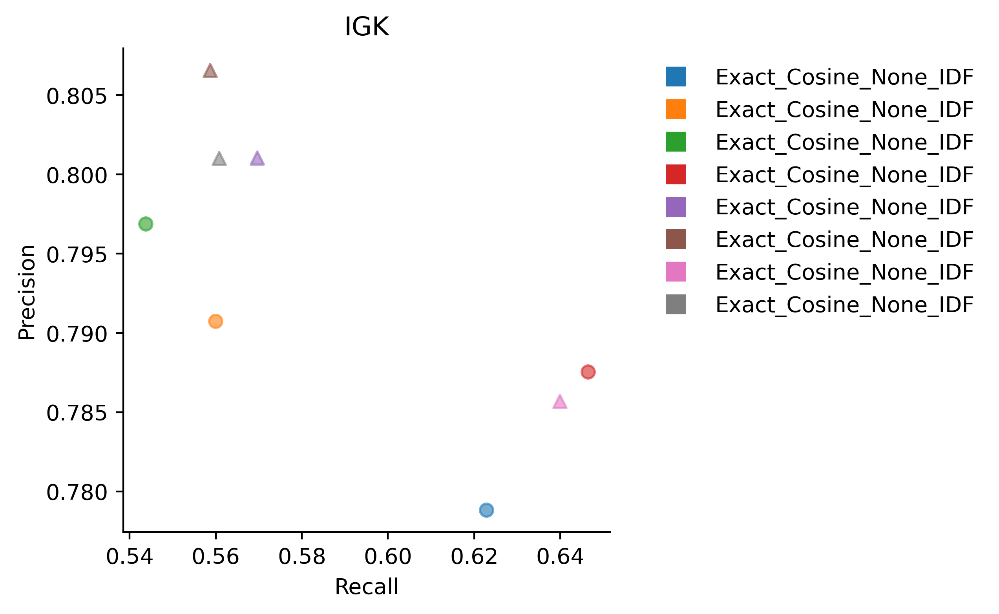

In [67]:
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, ax = plt.subplots(figsize=(4,4))
fig.subplots_adjust(wspace=0.3)
regions_origin = ['hla','igk','tair','yeast']
regions = ['HLA','IGK','Arabidopsis','Yeast']
y = target_df2[target_df2['sample'].str.contains('IGK', case=False)].loc[:,'precision'].tolist()
x = target_df2[target_df2['sample'].str.contains('IGK', case=False)].loc[:,'recall'].tolist()
category_color = colors[:8]
category_shape = ['o']*4+['^']*4
print(x,y)
for i in range(0,8):
    ax.scatter(x[i], y[i], color=category_color[i],marker=category_shape[i],alpha=0.6)
ax.set_title('IGK')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel('Precision')
ax.set_xlabel('Recall')

plt.subplots_adjust(hspace=0.3)

shape_list = ['o','s','^']


symbol_handles = [plt.Line2D([0], [0], marker=shape_list[i], color='w', markerfacecolor='black', markersize=10) 
                  for i in range(0,2)]
symbol_labels = ['8%Error/30k','5%Error/20k']
shape_legend = ax.legend(handles=symbol_handles, labels=symbol_labels, loc='upper right',frameon=False,bbox_to_anchor=(1.6,1.6))
ax.add_artist(shape_legend)
color_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=colors[i], markersize=10)
                 for i in range(0,8)]
color_labels = target_df2[target_df2['sample'].str.contains('IGK', case=False)]['method'].tolist()
ax.legend(handles=color_handles, labels=color_labels, loc='upper left',frameon=False,bbox_to_anchor=(1.05, 1))
# 将颜色图例添加到图中


plt.show()

In [68]:
target_df = df[(df.n_neighbors.isin(range(6,13)))&(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')&(df.loc[:,'sample'] == './CHM13/IGK')].sort_values(by=['method','sample'])

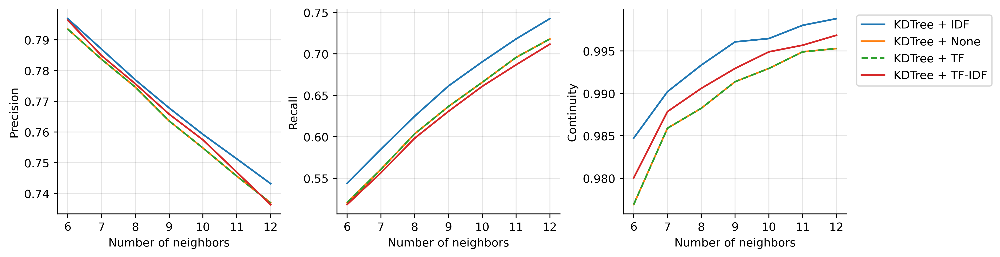

In [80]:
subtitution = {}
preprocess = ['TF','IDF','TF-IDF','None']
target_method = []
target_method_in_pic = []
for pre in preprocess:
    target_method.append('Exact_Cosine_None_'+pre)
    target_method_in_pic.append('KDTree + '+pre)
    subtitution['Exact_Cosine_None_'+pre] = 'KDTree + '+pre

target_df = df[(df.n_neighbors.isin(range(6,13)))&(df.method.isin(target_method)) & (df.sequence_type == 'pbsim_ONT_93_30k')&(df.loc[:,'sample'] == './CHM13/IGK')].sort_values(by=['method','sample'])
target_df = target_df.replace(subtitution)
k_values = np.arange(6, 13)
y_labels = dict(
    precision="Precision",
    recall="Recall",
    continuity="Continuity",
    connected_fraction="Connected fraction\n(after removing incorrect edges)"
)

color_list = seaborn.color_palette("tab10")

fig, axes = plt.subplots(1, 3, figsize=(12,3), constrained_layout=True)
for i, ax in enumerate(axes):
    y = list(y_labels)[i]
    x = 'n_neighbors'
    hue = 'method'
    for j,(desc, group) in enumerate(target_df.groupby(hue)): 
        if 'KDTree + TF' == desc:  
            linestyle = 'dashed'  
        elif 'Block' in desc: 
            linestyle = 'solid'
        elif '--' in desc:
            linestyle = 'dashdot'
        else:
            linestyle = 'solid'
        ax.plot(group[x], group[y], label=desc, color =  color_list[j], linestyle = linestyle)
    ax.set_xticks(k_values) 
    ax.set_xlabel("Number of neighbors")  
    ax.set_ylabel(ylabel_in_pic[i])  
    ax.grid(axis='both', color='k', alpha=0.1)  
    
    if i == 2:
        ax.legend(loc="upper left", bbox_to_anchor=(1.02, 1))
    ax.spines[['top', 'right']].set_visible(False)
plt.savefig("preprocess_plot.pdf",dpi=600)

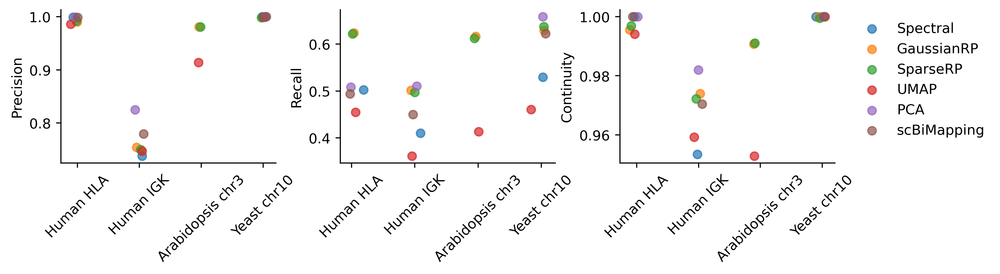

In [83]:
dims = ['Spectural_500d','GaussianRP_500d','SparseRP_500d','umap_500d','PCA_500d','scBiMap_500d']
dims_in_pic = ['Spectral','GaussianRP','SparseRP','UMAP','PCA','scBiMapping']
target_method = []
target_method_in_pic = []
for i,dim in enumerate(dims):
    target_method.append('HNSW_Cosine_'+dim+'_IDF')
    target_method_in_pic.append(dims_in_pic[i])
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Human HLA','Human IGK','Arabidopsis chr3','Yeast chr10']
 
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        if len(method_values) == 3:
            method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel_in_pic[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)
plt.savefig('dimension_reduction.pdf',dpi=600)

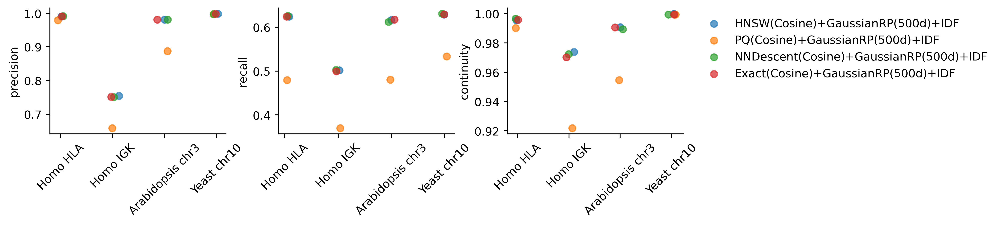

In [71]:
demethods = ['HNSW','PQ','NNDescent','Exact']
target_method = []
target_method_in_pic = []
for i,demethod in enumerate(demethods):
    target_method.append(demethod+'_Cosine_GaussianRP_500d_IDF')
    target_method_in_pic.append(demethod+'(Cosine)+GaussianRP(500d)+IDF')
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']
 
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        if len(method_values) == 3:
            method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)

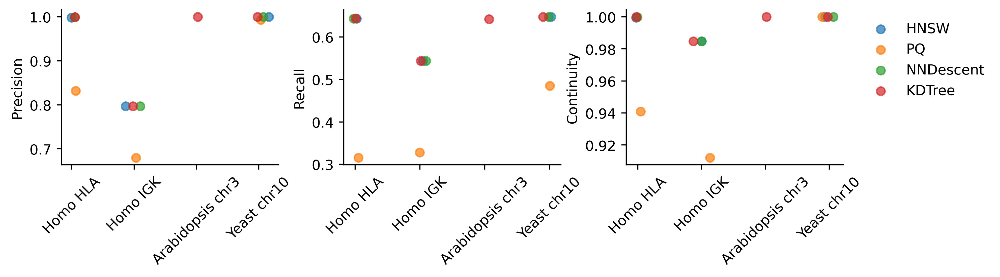

In [96]:
demethods = ['HNSW','PQ','NNDescent','Exact']
target_method = []
target_method_in_pic = []
for i,demethod in enumerate(demethods):
    target_method.append(demethod+'_Cosine_None_IDF')
target_method_in_pic =['HNSW','PQ','NNDescent','KDTree']
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']
 
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        if len(method_values) == 3:
            method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel_in_pic[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
plt.subplots_adjust(wspace=0.3)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)
#plt.savefig('approximate.pdf',dpi=600)

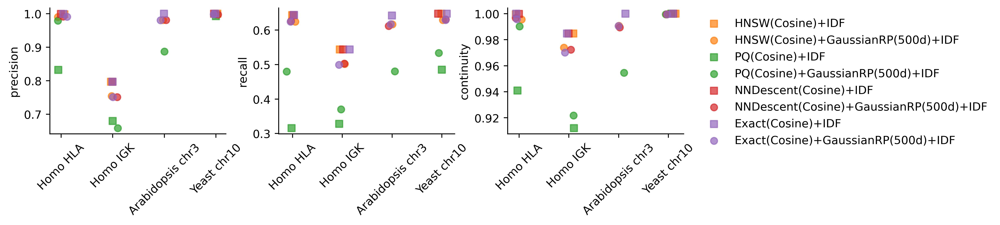

In [72]:
demethods = ['HNSW','PQ','NNDescent','Exact']
target_method = []
target_method_in_pic = []
for i,demethod in enumerate(demethods):
    target_method.append(demethod+'_Cosine_None_IDF')
    target_method_in_pic.append(demethod+'(Cosine)+IDF')
    target_method.append(demethod+'_Cosine_GaussianRP_500d_IDF')
    target_method_in_pic.append(demethod+'(Cosine)+GaussianRP(500d)+IDF')
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']
 
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']
colors_in_fig = [colors[1],colors[1],colors[2],colors[2],colors[3],colors[3],colors[4],colors[4]]

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        if len(method_values) == 3:
            method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        if 'GaussianRP' in method:
            marker_type = 'o'
        else:
            marker_type = 's'
        ax.scatter(x, method_values, color=colors_in_fig[i], label=target_method_in_pic[i],marker=marker_type,alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)

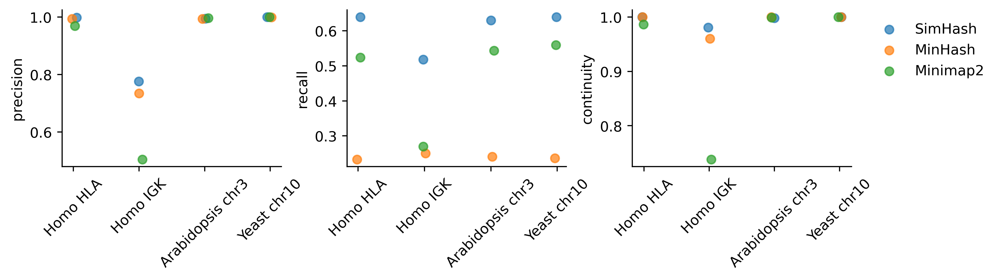

In [74]:
target_method = ['SimHash_Hamming_None_IDF','MinHash_Jaccard_None_IDF','Minimap2']
target_method_in_pic = ['SimHash','MinHash','Minimap2']
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['Homo HLA','Homo IGK','Arabidopsis chr3','Yeast chr10']
def rand_jitter(arr):
    stdev = .01 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        # if len(method_values) == 3:
        #     method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8) 
    ax.set_ylabel(ylabel[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)

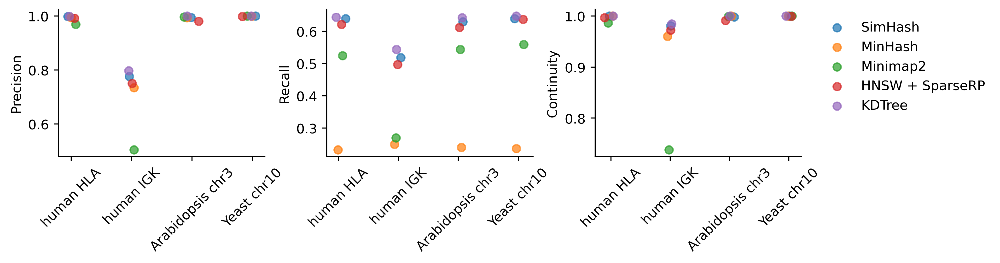

In [95]:
target_method = ['SimHash_Hamming_None_IDF','MinHash_Jaccard_None_IDF','Minimap2','HNSW_Cosine_SparseRP_500d_IDF','Exact_Cosine_None_IDF']
target_method_in_pic = ['SimHash','MinHash','Minimap2','HNSW + SparseRP','KDTree']
target_df = df[(df.sequence_type=='pbsim_ONT_93_30k')&(df.method.isin(target_method))&(df.n_neighbors==6)].sort_values(by=['sample','method'])

samples = ['./CHM13/HLA', './CHM13/IGK','./yeast/chr10', './TAIR/chr3']
samples_in_pic =['human HLA','human IGK','Arabidopsis chr3','Yeast chr10']
def rand_jitter(arr):
    stdev = .02 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev
colors = sns.color_palette(palette='tab10')
plt.rcParams['figure.dpi'] = 400
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,2))
fig.subplots_adjust(wspace=0.3)
ylabel = ['precision','recall','continuity']

for num,ax in enumerate([ax1,ax2,ax3]):
    for i, method in enumerate(target_method):
        method_values = target_df[target_df['method']==target_method[i]].loc[:,ylabel[num]].tolist()
        # if len(method_values) == 3:
        #     method_values.insert(2,None)
        x = rand_jitter([1,2,3,4]).tolist()
        ax.scatter(x, method_values, color=colors[i], label=target_method_in_pic[i],alpha=0.7)
    # ax.spines['left'].set_visible(False)
    ax.set_xticks(ticks = [1,2,3,4],labels = samples_in_pic)
    ax.set_xticklabels(samples_in_pic, rotation=45)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    yticks = ax.get_yticks()
    # for y in yticks:
    #     ax.axhline(y=y, linestyle='--', color='gray', linewidth=0.8)
    ax.set_ylabel(ylabel_in_pic[num])

# ax1.set_ylim(0.69,1.05)
# ax3.set_ylim(0.9309,1.005)
ax3.legend(bbox_to_anchor=(1.05, 1), loc='upper left',frameon=False)